In [5]:
import os
from os.path import exists
import torch
import torch.nn as nn
from torch.nn.functional import log_softmax, pad
import math
import copy
import time
from torch.optim.lr_scheduler import LambdaLR
import pandas as pd
import altair as alt
from torchtext.data.functional import to_map_style_dataset
from torch.utils.data import DataLoader
from torchtext.vocab import build_vocab_from_iterator
import torchtext.datasets as datasets
import spacy
import GPUtil
import warnings
from torch.utils.data.distributed import DistributedSampler
import torch.distributed as dist
import torch.multiprocessing as mp
from torch.nn.parallel import DistributedDataParallel as DDP


import numpy as np          # 导入NumPy库，用于进行矩阵运算和数据处理
import torch                # 导入PyTorch库，用于构建神经网络及相关操作
import torch.nn as nn       # 导入PyTorch神经网络模块，用于构建神经网络层
import torch.nn.functional as F  # 导入PyTorch神经网络函数库，用于激活函数、损失函数等
import math, copy, time          # 导入数学库、复制库和时间库，用于各种数学计算、复制操作和计时
from torch.autograd import Variable  # 从PyTorch自动微分库中导入Variable类，用于构建自动微分计算图
import matplotlib.pyplot as plt      # 导入Matplotlib的pyplot模块，用于绘制图表和可视化
import seaborn                       # 导入Seaborn库，用于绘制统计图形和美化图表


In [7]:
seaborn.set_context(context="talk")  # 设置Seaborn的上下文环境，设置图表的尺寸和标签字体大小等
# %matplotlib inline                   # IPython魔术命令，使Matplotlib绘制的图形直接显示在Notebook内


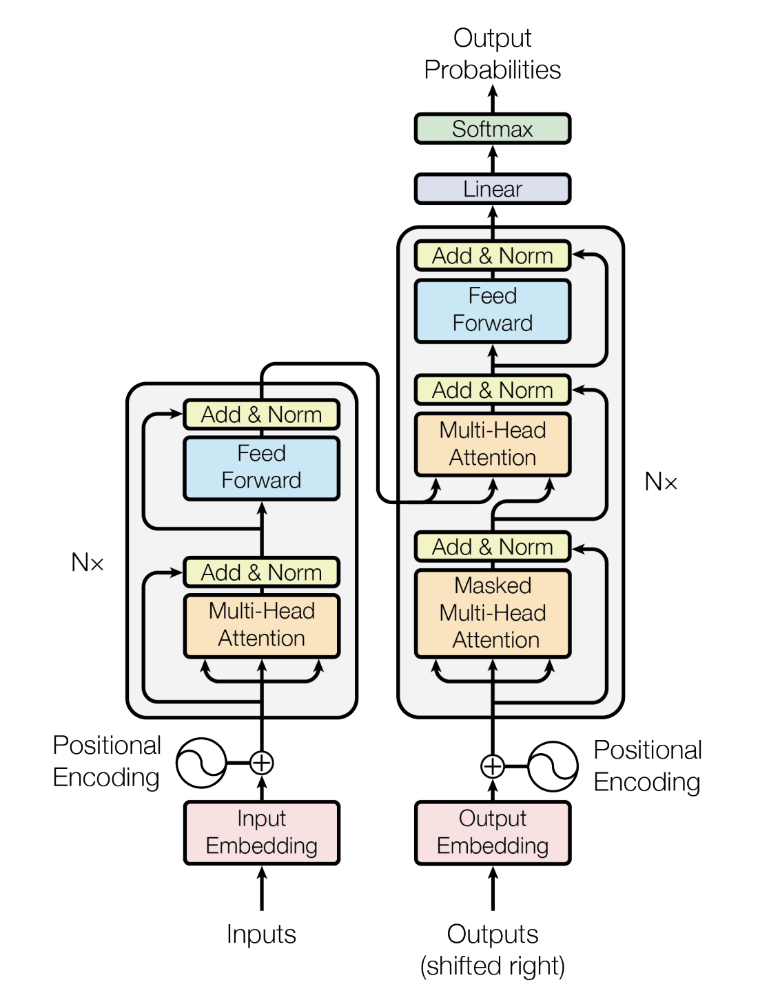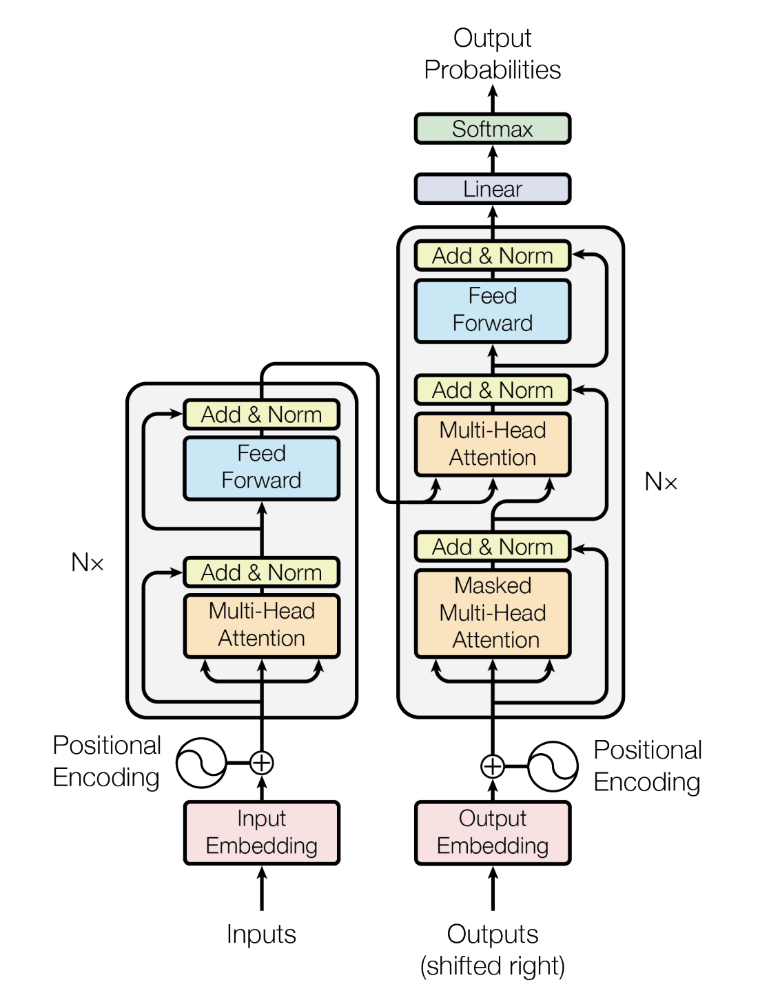

The Transformer follows this overall architecture using stacked self-attention and point-wise, fully connected layers for both the encoder and decoder, shown in the left and right halves of Figure 1, respectively.



# 1. Encoder Module

In [2]:
class EncoderDecoder(nn.Module):
    """
      A standard Encoder-Decoder architecture. Base for this and many
      other models.
    """

    def __init__(self, encoder, decoder, src_embed, tgt_embed, generator):
        # 确保EncoderDecoder类正确继承和初始化其父类nn.Module
        super(EncoderDecoder, self).__init__()
        self.encoder = encoder  # 将传入的编码器实例保存为类属性
        self.decoder = decoder  # 将传入的解码器实例保存为类属性
        self.src_embed = src_embed  # 将传入的源嵌入实例保存为类属性
        self.tgt_embed = tgt_embed  # 将传入的目标嵌入实例保存为类属性
        self.generator = generator  # 将传入的生成器实例保存为类属性


    # 前向传播方法，接收源序列、目标序列和它们的掩码作为参数
    def forward(self, src, tgt, src_mask, tgt_mask):
        # 对源序列进行编码，并将编码结果与掩码传递给解码器进行解码
        return self.decode(self.encode(src, src_mask), src_mask, tgt, tgt_mask)

    # 编码方法，接收源序列和掩码作为参数
    def encode(self, src, src_mask):
        # 将源序列进行嵌入，然后将嵌入后的序列和源序列掩码传给编码器
        return self.encoder(self.src_embed(src), src_mask)

    # 解码方法，接收编码器输出（memory）、源序列掩码、目标序列和目标序列掩码作为参数
    def decode(self, memory, src_mask, tgt, tgt_mask):
        # 将目标序列进行嵌入，然后将嵌入后的序列、编码器输出、源序列掩码和目标序列掩码传给解码器
        return self.decoder(self.tgt_embed(tgt), memory, src_mask, tgt_mask)


In [ ]:
class Generator(nn.Module):
    "Define standard linear + softmax generation step."

    def __init__(self, d_model, vocab):
        super(Generator, self).__init__()
        """
            这一层是输出层，所以输出的shape是 sequence_size * vocab_size, 最后通过log_softmax对vocab这个维度进行归一化，找到概率最大的词汇
            Examples:
            >>> m = nn.Linear(20, 30)
            >>> input = torch.randn(128, 20)
            >>> output = m(input)
            >>> print(output. size())
            torch.Size([128, 30])
        """
        self.proj = nn.Linear(d_model, vocab)

    def forward(self, x):
        # 将输入 x 传入线性层，然后对输出应用 log-softmax 激活函数（在最后一个维度上）
        """
        这个函数首先计算softmax，然后将结果取自然对数（logarithm）。这样做的好处是可以增加数值稳定性，特别是在处理非常小的概率值时。
        log_softmax函数中的参数dim=-1指定了在哪个维度上进行softmax操作。在Python中，负数索引表示从数组的末尾开始计数，因此dim=-1指的是最后一个维度。
        例如，假设你有一个二维张量（tensor），其形状为(batch_size, num_classes)，其中batch_size是批次中样本的数量，
        num_classes是类别的数量。如果你在这个张量上调用log_softmax(dim=-1)，
        那么softmax操作将会沿着num_classes这个维度进行，即每个样本的输出向量都会进行softmax归一化。
        """
        return log_softmax(self.proj(x), dim=-1)


# 1.1 Input process: embeddings + positional encoding

### 1.1.1 input embeddings

* 如果每句话都临时抱佛脚去生成对应的词向量，则处理起来无疑会费时费力，所以在实际应用中，会事先预训练好各种embedding矩阵，这些embedding矩阵包含常用领域常用单词的向量化表示，且提前做好分词。
* 当模型接收到某个句子时，便可以从对应的embedding矩阵里查找对应的词向量，最终把整句输入转换成对应的向量表示。（lut: look up table）

In [19]:
# an Embedding module containing 10 tensors of size 3
# 1st argument: num_embeddings (int): size of the dictionary of embeddings
# 2nd argument: embedding_dim (int): the size of each embedding vector
embedding = nn.Embedding(10, 3)
print(type(embedding))
# a batch of 2 samples of 4 indices each
input = torch.LongTensor([[1,2,4,5],[4,3,2,9]])
output = embedding(input)
print(output)
# Input: (*), IntTensor or LongTensor of arbitrary shape containing the indices to extract
# Output: (*, H), where * is the input shape and H = embedding_dim which is 3 in this case
# the shape is [2,4,3]
print(np.shape(output))

<class 'torch.nn.modules.sparse.Embedding'>
tensor([[[-1.8991,  0.8763,  1.2609],
         [-0.6043, -1.2806, -0.4959],
         [-1.6477,  0.7811,  1.2555],
         [ 0.3631,  0.7398,  0.5019]],

        [[-1.6477,  0.7811,  1.2555],
         [-0.4533, -0.5160,  0.5033],
         [-0.6043, -1.2806, -0.4959],
         [-0.2501,  0.9080,  1.0698]]], grad_fn=<EmbeddingBackward0>)
torch.Size([2, 4, 3])


In [20]:
class Embeddings(nn.Module):
    def __init__(self, d_model, vocab):
        # 调用父类nn.Module的初始化方法
        super(Embeddings, self).__init__()
        # 创建一个词嵌入层，参数为词汇表大小和词嵌入维度
        # vocab：一个整数，表示词汇表的大小，即有多少个不同的词汇（或token）。每个词汇都会被映射到一个唯一的整数索引上。 e.g: 37000
        # d_model：一个整数，表示每个嵌入向量的维度。这个维度决定了每个词汇在嵌入空间中的表示的复杂度。e.g: 512
        # nn.Embedding 返回一个嵌入查找表（lookup table），其中每个索引对应一个 d_model 维的向量。
        self.lut = nn.Embedding(vocab, d_model)
        # 将词嵌入维度保存为类属性
        self.d_model = d_model

    def forwad(self, x):
        # 通过词嵌入层将输入的单词编码为向量，并乘以词嵌入维度的平方根进行缩放(作为缩放因子)
        # Shape:
        # Input: (*), IntTensor or LongTensor of arbitrary shape containing the indices to extract
        # Output: (*, H), where * is the input shape and H = embedding_dim
        # 最后输出的shape是 [shape(x), d_model]
        return self.lut(x) * math.sqrt(self.d_model)

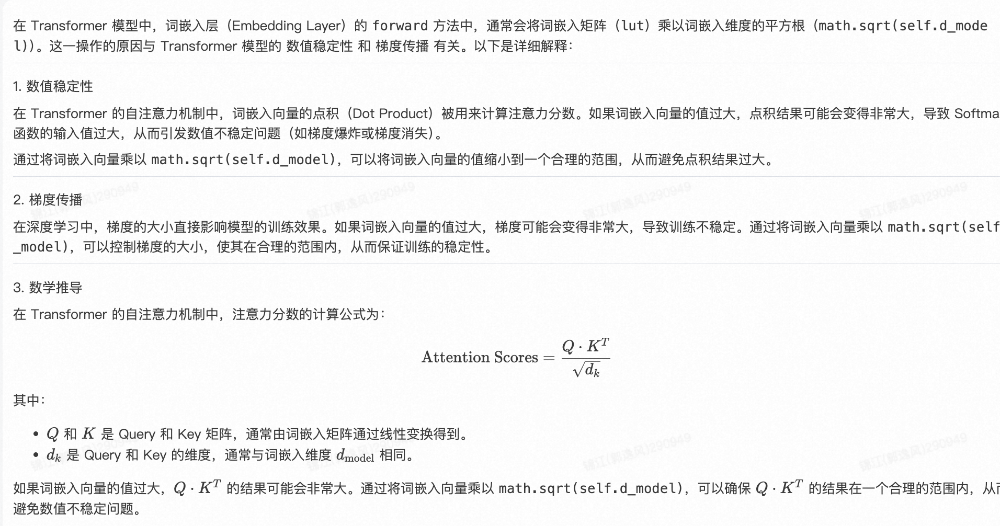

### 1.1.2 positional encoding

* 句子中token与token的顺序关系（相对位置、绝对位置）通过位置编码保存
* 位置编码的的维度与embedding一致，都为$d_{model}$